In [ ]:

!pip install lightgbm



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 14.0 kB/s eta 0:00:0000:0100:04m

[notice] A new release of pip is available: 24.0 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [ ]:


import pandas as pd
import lightgbm as lgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
import matplotlib.pyplot as plt


import seaborn as sns
sns.set_theme(style="whitegrid", palette="pastel")



In [ ]:

inventory_df = pd.read_csv('inventory_data.csv')
patient_df = pd.read_csv('patient_data.csv')
staff_df = pd.read_csv('staff_data.csv')
financial_df = pd.read_csv('financial_data.csv')


inventory_df = inventory_df.rename(columns={'Date': 'Inventory_Date'})
financial_df = financial_df.rename(columns={'Date': 'Financial_Date'})


combined_df = pd.concat([inventory_df, patient_df, staff_df, financial_df], axis=1)
combined_df.fillna(0, inplace=True)

print("Data merged successfully. Shape:", combined_df.shape)


Data merged successfully. Shape: (500, 34)


In [5]:
# Create Target Variable
combined_df['Estimated_Demand'] = combined_df['Avg_Usage_Per_Day'] * combined_df['Restock_Lead_Time']

# Create other features
combined_df['Inventory_Shortfall'] = (combined_df['Min_Required'] - combined_df['Current_Stock']).clip(lower=0)
combined_df['Replenishment_Needs'] = (combined_df['Max_Capacity'] - combined_df['Current_Stock']).clip(lower=0)

# Drop identifiable/non-predictive columns
columns_to_drop = ['Item_ID', 'Vendor_ID', 'Patient_ID', 'Staff_ID']
combined_df = combined_df.drop(columns=columns_to_drop, axis=1)

print("Features created. Columns:", combined_df.columns.tolist())

Features created. Columns: ['Inventory_Date', 'Item_Type', 'Item_Name', 'Current_Stock', 'Min_Required', 'Max_Capacity', 'Unit_Cost', 'Avg_Usage_Per_Day', 'Restock_Lead_Time', 'Admission_Date', 'Discharge_Date', 'Primary_Diagnosis', 'Procedure_Performed', 'Room_Type', 'Bed_Days', 'Supplies_Used', 'Equipment_Used', 'Staff_Needed', 'Staff_Type', 'Shift_Date', 'Shift_Start_Time', 'Shift_End_Time', 'Current_Assignment', 'Hours_Worked', 'Patients_Assigned', 'Overtime_Hours', 'Financial_Date', 'Expense_Category', 'Amount', 'Description', 'Estimated_Demand', 'Inventory_Shortfall', 'Replenishment_Needs']


In [ ]:
# 1. Drop Date columns (we don't need them for prediction)
date_columns = ['Inventory_Date', 'Admission_Date', 'Discharge_Date', 'Shift_Date', 'Financial_Date']

cols_to_drop = [col for col in date_columns if col in combined_df.columns]
df_clean = combined_df.drop(columns=cols_to_drop)

# 2. Convert Object columns to 'category' type

for col in df_clean.select_dtypes(include=['object']).columns:
    df_clean[col] = df_clean[col].astype('category')

# 3. Define Target and Features
y = df_clean['Estimated_Demand']
X = df_clean.drop(['Estimated_Demand'], axis=1)

# 4. Split data
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.3, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

print("Data prepared with Native Categories.")
print(f"Training shape: {X_train.shape}")


Data prepared with Native Categories.
Training shape: (350, 27)


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000238 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 901
[LightGBM] [Info] Number of data points in the train set: 350, number of used features: 27
[LightGBM] [Info] Start training from score 3918.005714
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain,

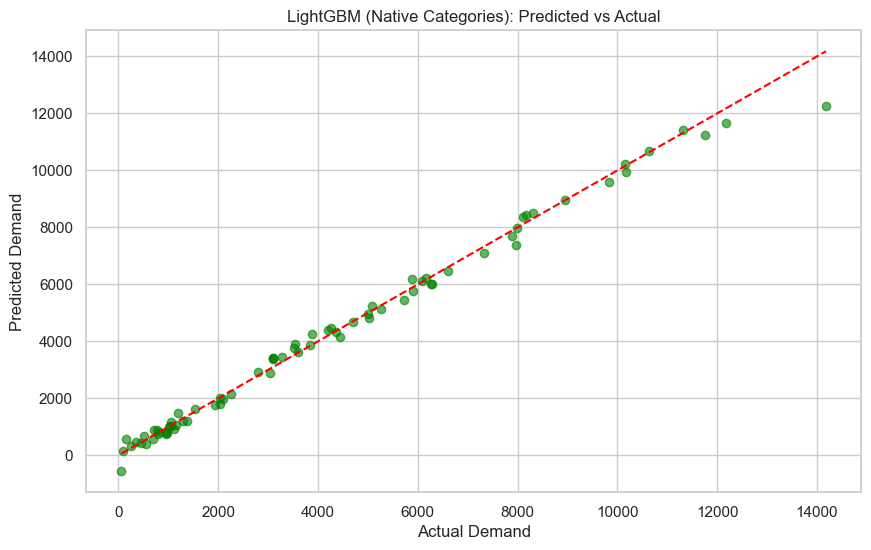

In [12]:
# Initialize LightGBM Regressor
model = lgb.LGBMRegressor(
    n_estimators=100,
    learning_rate=0.1,
    max_depth=3,
    random_state=42,
    n_jobs=-1
)

# Train the model
# LightGBM automatically detects the 'category' columns we created above
model.fit(
    X_train, 
    y_train,
    eval_set=[(X_val, y_val)],
    eval_metric='mae'
)

# Validate
y_val_pred = model.predict(X_val)
val_mae = mean_absolute_error(y_val, y_val_pred)
print(f"LightGBM (Native) Validation MAE: {val_mae}")

# Test
y_test_pred = model.predict(X_test)
test_mae = mean_absolute_error(y_test, y_test_pred)
print(f"LightGBM (Native) Test MAE: {test_mae}")

# Visualization
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6, color='green') # Changed color to green for new model
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Demand')
plt.ylabel('Predicted Demand')
plt.title('LightGBM (Native Categories): Predicted vs Actual')
plt.show()

Starting Grid Search...
Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000239 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 741
[LightGBM] [Info] Number of data points in the train set: 280, number of used features: 27
[LightGBM] [Info] Start training from score 4010.314286
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000173 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 748
[LightGBM] [Info] Number of data points in the train set: 280, number of used features: 27
[LightGBM] [Info] Start training from score 3847.928571
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000165 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 746
[LightGBM] [Info] Number of data 

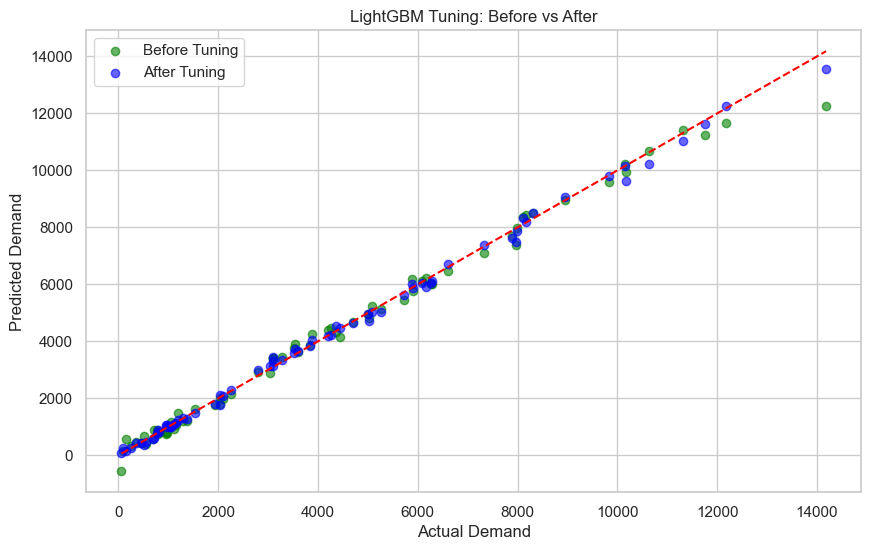

In [14]:
from sklearn.model_selection import GridSearchCV

# 1. Define the parameter grid to search
param_grid = {
    'num_leaves': [7, 15, 31],       
    'max_depth': [3, 5, -1],         
    'learning_rate': [0.01, 0.05, 0.1],
    'n_estimators': [100, 300, 500],
    'min_child_samples': [5, 10, 20] 
}

# 2. Initialize the model
# n_jobs=-1 here lets LightGBM use all cores for the current training run
lgb_estimator = lgb.LGBMRegressor(random_state=42, n_jobs=-1)

# 3. Setup Grid Search
# CRITICAL FIX: Set n_jobs=1 here to prevent crashing!
grid_search = GridSearchCV(
    estimator=lgb_estimator,
    param_grid=param_grid,
    cv=5,
    scoring='neg_mean_absolute_error',
    verbose=1,
    n_jobs=1  # Changed from -1 to 1 to stop the crash
)

# 4. Run the search on the training data
print("Starting Grid Search...")
grid_search.fit(X_train, y_train)

# 5. Get the best model
best_model = grid_search.best_estimator_

print(f"\nBest Params: {grid_search.best_params_}")

# 6. Evaluate the Tuned Model
y_test_pred_tuned = best_model.predict(X_test)
test_mae_tuned = mean_absolute_error(y_test, y_test_pred_tuned)

print(f"Tuned LightGBM Test MAE: {test_mae_tuned}")

# Visualization
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_test_pred, alpha=0.6, color='green', label='Before Tuning') # You might need to re-run Cell 5 to get y_test_pred in memory
plt.scatter(y_test, y_test_pred_tuned, alpha=0.6, color='blue', label='After Tuning')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')
plt.xlabel('Actual Demand')
plt.ylabel('Predicted Demand')
plt.title('LightGBM Tuning: Before vs After')
plt.legend()
plt.show()